# trendlines(uptrend and downtrend)
# scoring

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
import plotly.graph_objects as go
from convertdate import persian
import copy
from scipy.stats import linregress

In [25]:
file_path = "ticker_codes.json"

with open(file_path, 'r', encoding='utf-8') as file:
    data = json.load(file)
    
symbols_and_codes = [(item["code"], item["symbol"]) for item in data]
symbols_and_codes
    

[('7745894403636165', 'شپنا'),
 ('2400322364771558', 'شستا'),
 ('66772024744156373', 'فباهنر'),
 ('35425587644337450', 'فملی'),
 ('63917421733088077', 'وتجارت'),
 ('69143674941561637', 'پترول'),
 ('25244329144808274', 'فارس'),
 ('35424116338766901', 'حفارس'),
 ('65883838195688438', 'خودرو'),
 ('46348559193224090', 'فولاد'),
 ('35366681030756042', 'شبندر'),
 ('778253364357513', 'وبملت'),
 ('9098178887955847', 'شهر'),
 ('7395271748414592', 'وخارزم'),
 ('51617145873056483', 'شتران'),
 ('28864540805361867', 'فخوز'),
 ('66701874099226162', 'فاسمین'),
 ('26014913469567886', 'وغدیر'),
 ('28320293733348826', 'وبصادر'),
 ('71483646978964608', 'ذوب')]

In [26]:
df = pd.read_csv(f"c-71483646978964608-candle.csv").head(5)
df

,Unnamed: 0,open_price,min_price,max_price,close_price,trade_volume,date
0,0,239,226,244,230,210506642,13990105
1,1,231,230,239,238,213584985,13990106
2,2,241,237,248,248,274807499,13990109
3,3,252,245,256,249,317918782,13990110
4,4,251,245,259,256,273617729,13990111


In [27]:
for code, symbol in symbols_and_codes:
    print(pd.read_csv(f"c-{code}-candle.csv").head(5))
    print("_________________________________________")

   Unnamed: 0  open_price  min_price  max_price  close_price  trade_volume  \
0           0         477        465        486          465      80469368   
1           1         465        461        484          482     105718113   
2           2         488        471        488          484     104732569   
3           3         488        471        492          475     108795640   
4           4         476        467        481          477      81335616   

       date  
0  13990105  
1  13990106  
2  13990109  
3  13990110  
4  13990111  
_________________________________________
   Unnamed: 0  open_price  min_price  max_price  close_price  trade_volume  \
0           0         240        240        240          240       9378451   
1           1         248        248        248          248       4344609   
2           2         251        251        251          251       7498654   
3           3         258        258        258          258       6442297   
4           4  

In [28]:
DFs = {}
for code, symbol in symbols_and_codes:
    filename = f"c-{code}-candle.csv"
    DFs[symbol] = pd.read_csv(filename)

In [29]:
df_shapna = DFs["شپنا"]
df_shapna.head()

,Unnamed: 0,open_price,min_price,max_price,close_price,trade_volume,date
0,0,477,465,486,465,80469368,13990105
1,1,465,461,484,482,105718113,13990106
2,2,488,471,488,484,104732569,13990109
3,3,488,471,492,475,108795640,13990110
4,4,476,467,481,477,81335616,13990111


In [30]:
for symbol in DFs:
    DFs[symbol].drop("Unnamed: 0", axis=1, inplace=True)

In [31]:
df_shapna = DFs["شپنا"]
df_shapna.head()

,open_price,min_price,max_price,close_price,trade_volume,date
0,477,465,486,465,80469368,13990105
1,465,461,484,482,105718113,13990106
2,488,471,488,484,104732569,13990109
3,488,471,492,475,108795640,13990110
4,476,467,481,477,81335616,13990111


In [121]:
def convert_persian_to_gregorian(persian_date):
    year = persian_date // 10000
    month = (persian_date // 100) % 100
    day = persian_date % 100
    gregorian_date = persian.to_gregorian(year, month, day)
    return pd.Timestamp(f"{gregorian_date[0]}-{gregorian_date[1]:02d}-{gregorian_date[2]:02d}")

In [ ]:
gregorian_DFs = copy.deepcopy(DFs)

for symbol in gregorian_DFs:
    gregorian_DFs[symbol]['date'] = gregorian_DFs[symbol]['date'].apply(convert_persian_to_gregorian)
    #gregorian_DFs[symbol].set_index('date', inplace=True)

In [135]:
df_shapna = gregorian_DFs["شپنا"]
df_shapna.head()

,open_price,min_price,max_price,close_price,trade_volume
date,,,,,
2020-03-24,477,465,486,465,80469368
2020-03-25,465,461,484,482,105718113
2020-03-28,488,471,488,484,104732569
2020-03-29,488,471,492,475,108795640
2020-03-30,476,467,481,477,81335616


In [124]:
for symbol in gregorian_DFs:
    
    fig = go.Figure(data=[go.Candlestick(x=gregorian_DFs[symbol].index,
                                           open=gregorian_DFs[symbol]['open_price'],
                                           high=gregorian_DFs[symbol]['max_price'],
                                           low=gregorian_DFs[symbol]['min_price'],
                                           close=gregorian_DFs[symbol]['close_price'])])

    fig.update_layout(title=f'Candlestick Chart for {symbol}',
                      xaxis_title='Date',
                      yaxis_title='Price',
                      xaxis_rangeslider_visible=False)


    fig.show()

In [44]:
def persian_date_to_string(persian_date):
    year = persian_date // 10000
    month = (persian_date // 100) % 100
    day = persian_date % 100
    return f"{year}/{month:02d}/{day:02d}"

In [45]:
persian_DFs = copy.deepcopy(DFs)

for symbol in persian_DFs:
    persian_DFs[symbol]['date'] = persian_DFs[symbol]['date'].apply(persian_date_to_string)
    #persian_DFs[symbol].set_index('date', inplace=True)

In [46]:
df_shapna = persian_DFs["شپنا"]
df_shapna.head()

,open_price,min_price,max_price,close_price,trade_volume,date
0,477,465,486,465,80469368,1399/01/05
1,465,461,484,482,105718113,1399/01/06
2,488,471,488,484,104732569,1399/01/09
3,488,471,492,475,108795640,1399/01/10
4,476,467,481,477,81335616,1399/01/11


In [47]:
for symbol in persian_DFs:
    
    fig = go.Figure(data=[go.Candlestick(x=persian_DFs[symbol]['date'],
                                           open=persian_DFs[symbol]['open_price'],
                                           high=persian_DFs[symbol]['max_price'],
                                           low=persian_DFs[symbol]['min_price'],
                                           close=persian_DFs[symbol]['close_price'])])

    fig.update_layout(title=f'Candlestick Chart for {symbol}',
                      xaxis_title='Date',
                      yaxis_title='Price',
                      xaxis_rangeslider_visible=False)


    fig.show()

In [48]:
df = copy.deepcopy(persian_DFs["شپنا"])
df.head()

,open_price,min_price,max_price,close_price,trade_volume,date
0,477,465,486,465,80469368,1399/01/05
1,465,461,484,482,105718113,1399/01/06
2,488,471,488,484,104732569,1399/01/09
3,488,471,492,475,108795640,1399/01/10
4,476,467,481,477,81335616,1399/01/11


In [49]:
def find_trendlines(df, window=1):
    highs = df['close_price'].rolling(window).max()
    lows = df['close_price'].rolling(window).min()

    df['number'] = np.arange(len(df)) + 1

    # Calculate uptrend line
    df_high = df[['number', 'close_price']].copy()
    while len(df_high) > 2:
        slope_up, intercept_up, _, _, _ = linregress(x=df_high['number'], y=df_high['close_price'])
        df_high = df_high.loc[df_high['close_price'] > slope_up * df_high['number'] + intercept_up]

    # Calculate downtrend line
    df_low = df[['number', 'close_price']].copy()
    while len(df_low) > 2:
        slope_down, intercept_down, _, _, _ = linregress(x=df_low['number'], y=df_low['close_price'])
        df_low = df_low.loc[df_low['close_price'] < slope_down * df_low['number'] + intercept_down]

    df['uptrend'] = slope_up * df['number'] + intercept_up
    df['downtrend'] = slope_down * df['number'] + intercept_down

    return df

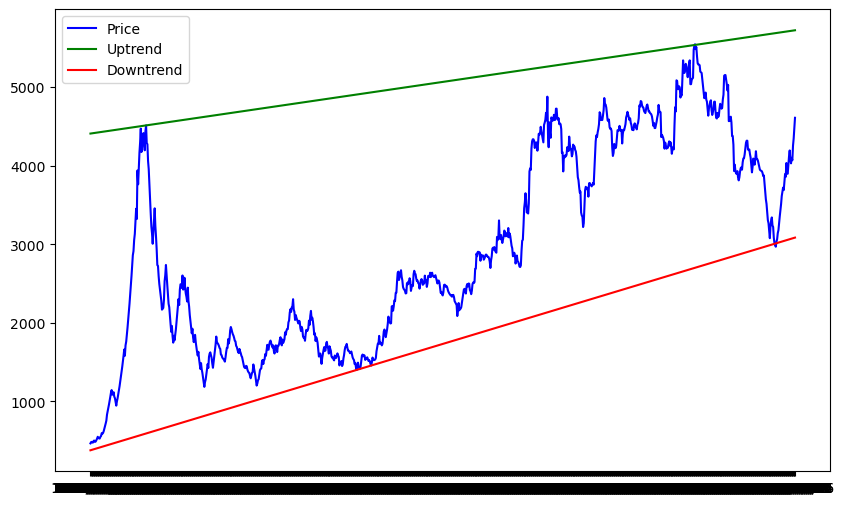

In [50]:
# Find trendlines
sliced_df = find_trendlines(df)

# Plot the data with trendlines
plt.figure(figsize=(10, 6))
plt.plot(df['date'], df['close_price'], label='Price', color='blue')
plt.plot(sliced_df['date'], sliced_df['uptrend'], label='Uptrend', color='green')
plt.plot(sliced_df['date'], sliced_df['downtrend'], label='Downtrend', color='red')
plt.legend()
plt.show()

In [51]:
for symbol in persian_DFs:
    
    df = find_trendlines(copy.deepcopy(persian_DFs[symbol]))
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=df['date'], y=df['close_price'], mode='lines', name='Close Price', line=dict(color='blue')))
    fig.add_trace(go.Scatter(x=df['date'], y=df['uptrend'], mode='lines', name='Uptrend', line=dict(color='green')))
    fig.add_trace(go.Scatter(x=df['date'], y=df['downtrend'], mode='lines', name='Downtrend', line=dict(color='red')))
    
    fig.update_layout(title=f'{symbol}',
                      xaxis_title='Date',
                      yaxis_title='Price',
                      template='plotly')

    fig.show()

In [62]:
# Function to identify trendlines
def find_trendlines(data, split_index):
    df = data.copy()
    df['number'] = np.arange(len(df)) + 1
    first_part = df.iloc[:split_index].copy()

    # Calculate uptrend line from peaks
    df_high = first_part[['number', 'close_price']].copy()
    while len(df_high) > 2:
        slope_up, intercept_up, _, _, _ = linregress(x=df_high['number'], y=df_high['close_price'])
        df_high = df_high.loc[df_high['close_price'] > slope_up * df_high['number'] + intercept_up]

    # Calculate downtrend line from valleys
    df_low = first_part[['number', 'close_price']].copy()
    while len(df_low) > 2:
        slope_down, intercept_down, _, _, _ = linregress(x=df_low['number'], y=df_low['close_price'])
        df_low = df_low.loc[df_low['close_price'] < slope_down * df_low['number'] + intercept_down]

    # Determine overall trend
    total_trend = "upward" if slope_up > 0 else "downward"

    df['uptrend'] = slope_up * df['number'] + intercept_up
    df['downtrend'] = slope_down * df['number'] + intercept_down

    return df, slope_up, intercept_up, slope_down, intercept_down, total_trend

In [63]:
# Function to score the second portion based on trendlines and trend direction
def score_trendlines(data, split_index, slope_up, intercept_up, slope_down, intercept_down, total_trend):
    second_part = data.iloc[split_index:].copy()
    second_part['number'] = np.arange(len(second_part)) + split_index + 1

    scores = []
    was_breaking_uptrend = False
    was_breaking_downtrend = False

    for _, row in second_part.iterrows():
        price = row['close_price']
        uptrend = slope_up * row['number'] + intercept_up
        downtrend = slope_down * row['number'] + intercept_down
        score = 0

        if total_trend == "upward":
            # Trendline from valleys
            if price < downtrend:
                if not was_breaking_downtrend:
                    score = -10  # Break
                    was_breaking_downtrend = True
                else:
                    was_breaking_downtrend = True
            elif price == downtrend:
                score = 10  # Collision
                was_breaking_downtrend = False
            else:
                was_breaking_downtrend = False

            # Trendline from peaks
            if price > uptrend:
                if not was_breaking_uptrend:
                    score = 7  # Break
                    was_breaking_uptrend = True
                else:
                    was_breaking_uptrend = True
            elif price == uptrend:
                score = -10  # Collision
                was_breaking_uptrend = False
            else:
                was_breaking_uptrend = False

        elif total_trend == "downward":
            # Trendline from peaks
            if price > uptrend:
                if not was_breaking_uptrend:
                    score = 10  # Break
                    was_breaking_uptrend = True
                else:
                    was_breaking_uptrend = True
            elif price == uptrend:
                score = -8  # Collision
                was_breaking_uptrend = False
            else:
                was_breaking_uptrend = False

            # Trendline from valleys
            if price < downtrend:
                if not was_breaking_downtrend:
                    score = -8  # Break
                    was_breaking_downtrend = True
                else:
                    was_breaking_downtrend = True
            elif price == downtrend:
                score = 10  # Collision
                was_breaking_downtrend = False
            else:
                was_breaking_downtrend = False

        scores.append(score)

    second_part['score'] = scores
    #print(sum(scores))
    return second_part, sum(scores)

In [64]:
df = copy.deepcopy(persian_DFs["شپنا"])
df.head()

,open_price,min_price,max_price,close_price,trade_volume,date
0,477,465,486,465,80469368,1399/01/05
1,465,461,484,482,105718113,1399/01/06
2,488,471,488,484,104732569,1399/01/09
3,488,471,492,475,108795640,1399/01/10
4,476,467,481,477,81335616,1399/01/11


In [65]:
# Divide DataFrame into portions
split_index = len(df) // 2
df, slope_up, intercept_up, slope_down, intercept_down, total_trend = find_trendlines(df, split_index)

In [66]:
# Calculate scores for the second portion
scored_df, score = score_trendlines(df, split_index, slope_up, intercept_up, slope_down, intercept_down, total_trend)
score


20

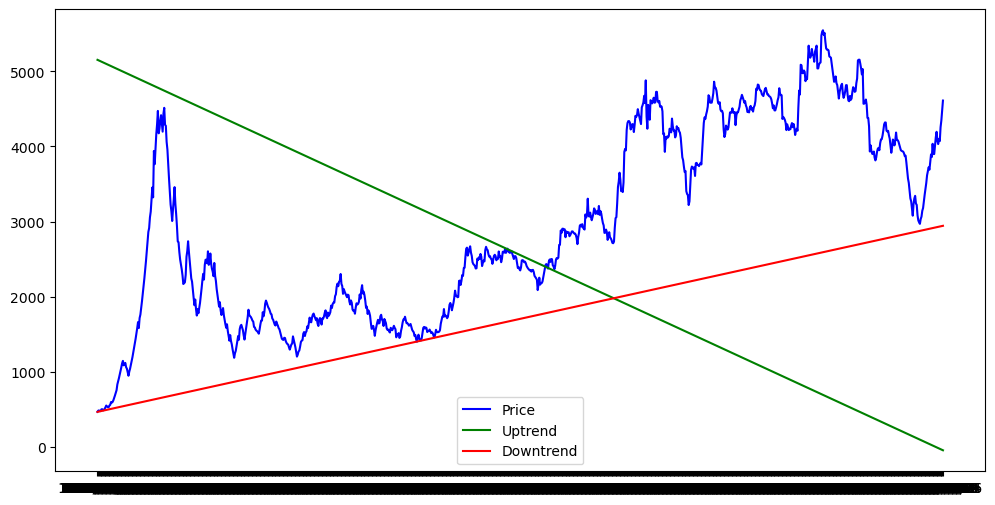

In [67]:
# Plot the data with trendlines and scores
plt.figure(figsize=(12, 6))
plt.plot(df['date'], df['close_price'], label='Price', color='blue')
plt.plot(df['date'], df['uptrend'], label='Uptrend', color='green')
plt.plot(df['date'], df['downtrend'], label='Downtrend', color='red')
#plt.scatter(scored_df['date'], scored_df['close_price'], c=scored_df['score'], cmap='coolwarm', label='Scores')
#plt.colorbar(label='Score')
plt.legend()
plt.show()

In [ ]:
for symbol in persian_DFs:
    
    split_index = len(persian_DFs[symbol]) // 2
    df, slope_up, intercept_up, slope_down, intercept_down, total_trend = find_trendlines(copy.deepcopy(persian_DFs[symbol]), split_index)
    scored_df, score = score_trendlines(copy.deepcopy(persian_DFs[symbol]), split_index, slope_up, intercept_up, slope_down, intercept_down, total_trend)
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=df['date'], y=df['close_price'], mode='lines', name='Close Price', line=dict(color='blue')))
    fig.add_trace(go.Scatter(x=df['date'], y=df['uptrend'], mode='lines', name='Uptrend', line=dict(color='green')))
    fig.add_trace(go.Scatter(x=df['date'], y=df['downtrend'], mode='lines', name='Downtrend', line=dict(color='red')))
    
    fig.update_layout(title=f'{symbol}, Score: {score}',
                      xaxis_title='Date',
                      yaxis_title='Price',
                      template='plotly')

    fig.show()

In [74]:
# Function to calculate channel
def calculate_channel(data, split_index):
    
    df = data.copy()
    df['number'] = np.arange(len(df)) + 1
    first_part = df.iloc[:split_index].copy()
    
    # Calculate regression line for the center of the channel
    slope, intercept, _, _, _ = linregress(x=first_part['number'], y=first_part['close_price'])
    center_line = slope * df['number'] + intercept

    # Calculate the channel boundaries
    first_part['residuals'] = first_part['close_price'] - (slope * first_part['number'] + intercept)
    channel_width = first_part['residuals'].abs().max()
    df['channel_top'] = center_line + channel_width
    df['channel_bottom'] = center_line - channel_width

    # Determine the channel direction
    total_trend = "upward" if slope > 0 else "downward"

    return df, total_trend, slope

In [75]:
# Function to score based on the channel
def score_channel(data, split_index, total_trend):
    second_part = data.iloc[split_index:].copy()
    second_part['number'] = np.arange(len(second_part)) + split_index + 1

    scores = []
    was_breaking_top = False
    was_breaking_bottom = False

    for _, row in second_part.iterrows():
        price = row['close_price']
        channel_top = row['channel_top']
        channel_bottom = row['channel_bottom']
        score = 0

        if total_trend == "upward" or total_trend == "downward":
            # Interactions with the top line of the channel
            if price > channel_top:
                if not was_breaking_top:
                    score = 10  # Break and remain above
                    was_breaking_top = True
            elif price == channel_top:
                score = -10  # Collision with the top
                was_breaking_top = False
            elif price < channel_top and was_breaking_top:
                score = -5  # Break and return under
                was_breaking_top = False

            # Interactions with the bottom line of the channel
            if price < channel_bottom:
                if not was_breaking_bottom:
                    score = -10  # Break and remain below
                    was_breaking_bottom = True
            elif price == channel_bottom:
                score = 10  # Collision with the bottom
                was_breaking_bottom = False
            elif price > channel_bottom and was_breaking_bottom:
                score = -5  # Break and return above
                was_breaking_bottom = False

        scores.append(score)

    second_part['score'] = scores
    return second_part, sum(scores)


In [76]:
df = copy.deepcopy(persian_DFs["شپنا"])
df.head()

,open_price,min_price,max_price,close_price,trade_volume,date
0,477,465,486,465,80469368,1399/01/05
1,465,461,484,482,105718113,1399/01/06
2,488,471,488,484,104732569,1399/01/09
3,488,471,492,475,108795640,1399/01/10
4,476,467,481,477,81335616,1399/01/11


In [77]:
# Divide DataFrame into portions
split_index = len(df) // 2
df, total_trend, slope = calculate_channel(df, split_index)

# Score interactions with the channel in the second portion
scored_df, score = score_channel(df, split_index, total_trend)

score

25

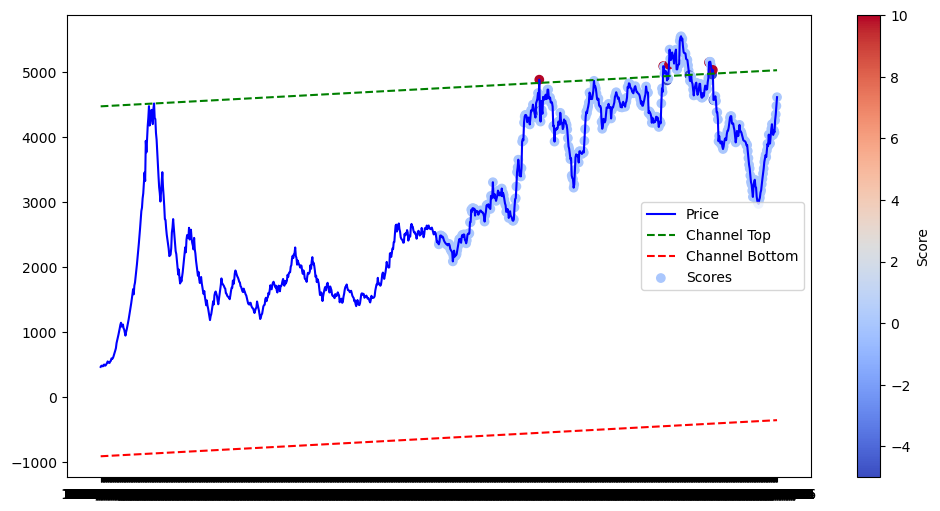

In [79]:
# Plot the data with channels and scores
plt.figure(figsize=(12, 6))
plt.plot(df['date'], df['close_price'], label='Price', color='blue')
plt.plot(df['date'], df['channel_top'], label='Channel Top', color='green', linestyle='--')
plt.plot(df['date'], df['channel_bottom'], label='Channel Bottom', color='red', linestyle='--')
plt.scatter(scored_df['date'], scored_df['close_price'], c=scored_df['score'], cmap='coolwarm', label='Scores')
plt.colorbar(label='Score')
plt.legend()
plt.show()

In [80]:
for symbol in copy.deepcopy(persian_DFs):
    df = persian_DFs[symbol]
    split_index = len(df) // 2
    df, total_trend, slope = calculate_channel(df, split_index)
    scored_df, score = score_channel(df, split_index, total_trend)
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=df['date'], y=df['close_price'], mode='lines', name='Close Price', line=dict(color='blue')))
    fig.add_trace(go.Scatter(x=df['date'], y=df['channel_top'], mode='lines', name='Channel Top', line=dict(color='green')))
    fig.add_trace(go.Scatter(x=df['date'], y=df['channel_bottom'], mode='lines', name='Channel Bottom', line=dict(color='red')))
    
    fig.update_layout(title=f'{symbol}, Score: {score}',
                      xaxis_title='Date',
                      yaxis_title='Price',
                      template='plotly')

    fig.show()